# Clustering MNIST by K-Mean

## 1. Load Data

In [38]:
import os
import numpy as np

data_path = 'D:\WorkSpace_Thinh1\lab4_ml'
# train path
train_images_path = os.path.join(data_path, 'train-images-idx3-ubyte.gz')
train_labels_path = os.path.join(data_path, 'train-labels-idx1-ubyte.gz')
# test path
test_images_path = os.path.join(data_path, 't10k-images-idx3-ubyte.gz')
test_labels_path = os.path.join(data_path, 't10k-labels-idx1-ubyte.gz')

In [39]:
def get_mnist_data(images_path, labels_path, num_images
, shuffle=False, _is=True, image_size=28):
    """
    This shuffle param is active when .gz is downloaded at:
    - 'http://yann.lecun.com/exdb/mnist/'
    - This function return random num_images in 60000 or 10000
    """
    # read data
    import gzip # to decompress gz (zip) file
    # open file training to read training data
    f_images = gzip.open(images_path,'r')
    # skip 16 first bytes because these are not data, only header infor
    f_images.read(16)
    # general: read num_images data samples if this parameter is set;
    # if not, read all (60000 training or 10000 test)
    real_num = num_images if not shuffle else (60000 if _is else 10000)
    # read all data to buf_images (28x28xreal_num)
    buf_images = f_images.read(image_size * image_size * real_num)
    # images
    images = np.frombuffer(buf_images, dtype=np.uint8).astype(np.float32)
    images = images.reshape(real_num, image_size, image_size,)
    # Read labels
    f_labels = gzip.open(labels_path,'r')
    f_labels.read(8)
    labels = np.zeros((real_num)).astype(np.int64)
    # rearrange to correspond the images and labels
    for i in range(0, real_num):
        buf_labels = f_labels.read(1)
        labels[i] = np.frombuffer(buf_labels, dtype=np.uint8).astype(np.int64)
        # shuffle to get random images data
    if shuffle is True:
        rand_id = np.random.randint(real_num, size=num_images)
        images = images[rand_id, :]
        labels = labels[rand_id,]
    # change images data to type of vector 28x28 dimentional
    images = images.reshape(num_images, image_size * image_size)
    return images, labels

In [40]:
train_images, train_labels = get_mnist_data(
train_images_path, train_labels_path,60000, shuffle=False)
test_images, test_labels = get_mnist_data(
test_images_path, test_labels_path, 10000, _is=False, shuffle=False)
print(train_images.shape, train_labels.shape)
print(test_images.shape, test_labels.shape)

(60000, 784) (60000,)
(10000, 784) (10000,)


## 2. Check data

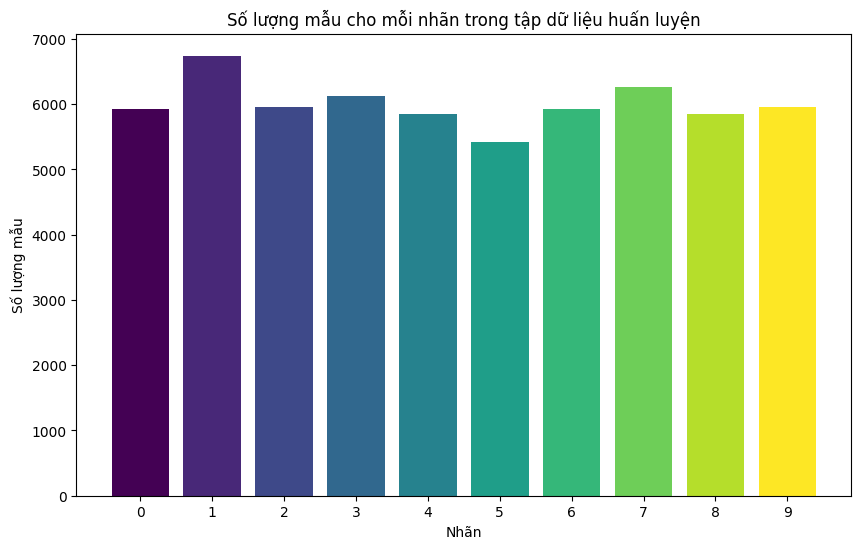

In [41]:
import matplotlib.pyplot as plt

label_counts = np.bincount(train_labels)
colors = plt.cm.viridis(np.linspace(0, 1, len(label_counts)))
labels = np.arange(len(label_counts))

plt.figure(figsize=(10, 6))
plt.bar(labels, label_counts, color=colors)
plt.xlabel('Nhãn')
plt.ylabel('Số lượng mẫu')
plt.title('Số lượng mẫu cho mỗi nhãn trong tập dữ liệu huấn luyện')

plt.xticks(labels)

plt.show()

## 3. Clustering by K-mean

### 3.1 Clustering with original and Visual 2D

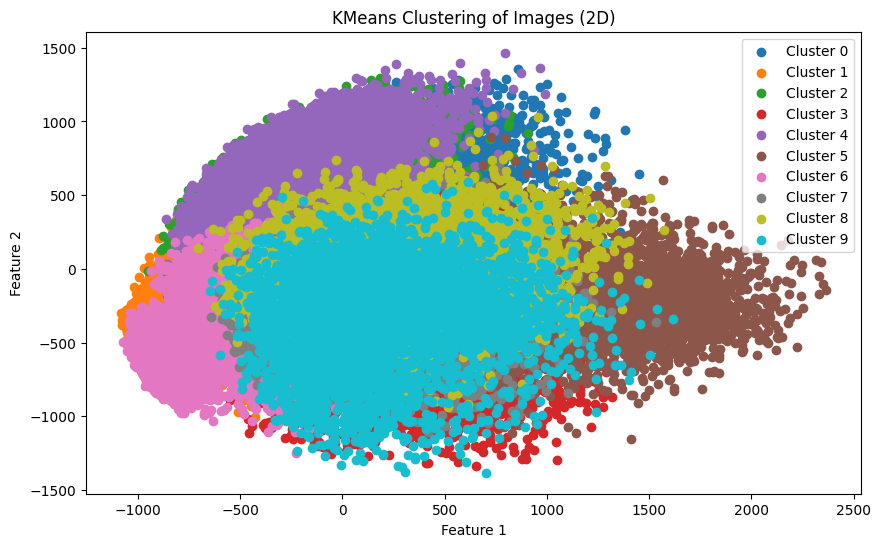

In [42]:
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Sử dụng KMeans để gom thành 10 cụm
n_clusters = 10
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans.fit(train_images)

# Giảm chiều dữ liệu xuống còn 2 chiều để trực quan hóa
pca = PCA(n_components=2)
transformed = pca.fit_transform(train_images)

# Hiển thị trực quan và đánh dấu các cụm
plt.figure(figsize=(10, 6))

for i in range(n_clusters):
    cluster_points = transformed[kmeans.labels_ == i]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {i}')

plt.title('KMeans Clustering of Images (2D)')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()
plt.show()

### 3.2 Clustering with original data and Visual 3D

In [43]:
import numpy as np
from sklearn.cluster import KMeans
import plotly.graph_objs as go
from sklearn.decomposition import PCA


# Chú ý: cần phải có sự chuyển đổi dữ liệu ảnh thành 1D vector trước khi sử dụng KMeans

# Sử dụng KMeans để gom thành 10 cụm
n_clusters = 10
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans.fit(train_images)

# Giảm chiều dữ liệu xuống còn 3 chiều để trực quan hóa
pca = PCA(n_components=3)
transformed = pca.fit_transform(train_images)

# Tạo biểu đồ 3D có thể xoay được
fig = go.Figure()

for i in range(n_clusters):
    cluster_points = transformed[kmeans.labels_ == i]
    fig.add_trace(go.Scatter3d(
        x=cluster_points[:, 0],
        y=cluster_points[:, 1],
        z=cluster_points[:, 2],
        mode='markers',
        marker=dict(size=4),
        name=f'Cluster {i}'
    ))

fig.update_layout(
    title='KMeans Clustering of Images (3D)',
    scene=dict(
        xaxis_title='Feature 1',
        yaxis_title='Feature 2',
        zaxis_title='Feature 3'
    ),
    margin=dict(l=0, r=0, b=0, t=0)
)

fig.show()


### 3.3 Clustering with original (784) data and data PCA and evaluate

#### 3.3.1 Data original vs Data PCA (150) / Visual 2D

Adjusted Rand Index (original): 0.35988270313670967
Adjusted Rand Index (PCA): 0.3811772816072476


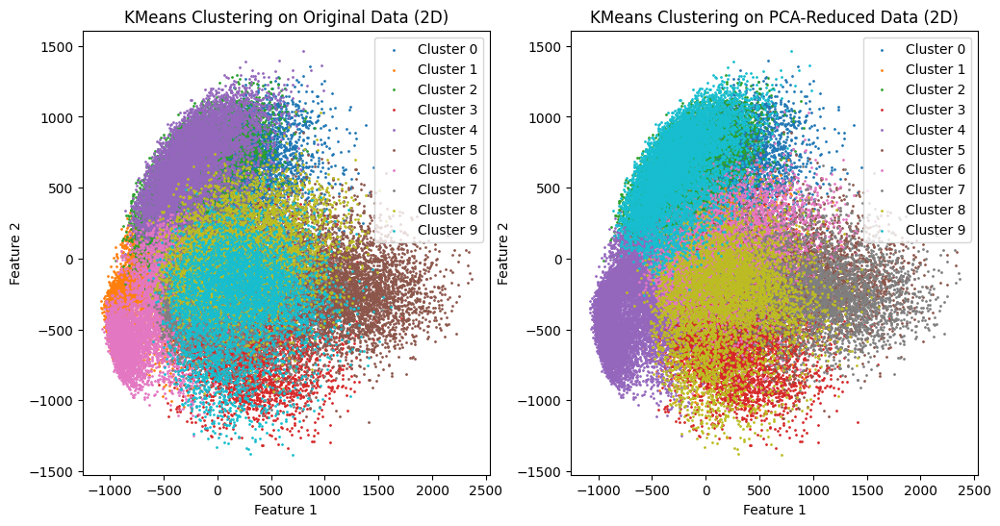

In [44]:
import os
import numpy as np
import gzip
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score, adjusted_rand_score

# Sử dụng KMeans để gom thành 10 cụm trên dữ liệu gốc
n_clusters = 10
kmeans_orig = KMeans(n_clusters=n_clusters, random_state=42)
kmeans_orig.fit(train_images)

# Giảm chiều dữ liệu xuống còn 150 chiều với PCA
pca_50 = PCA(n_components=150)
train_images_pca = pca_50.fit_transform(train_images)

# Sử dụng KMeans để gom thành 10 cụm trên dữ liệu đã giảm chiều
kmeans_pca = KMeans(n_clusters=n_clusters, random_state=42)
kmeans_pca.fit(train_images_pca)

# Tính toán thước đo cho dữ liệu gốc
ari_orig = adjusted_rand_score(train_labels, kmeans_orig.labels_)
print("Adjusted Rand Index (original):", ari_orig)

# Tính toán thước đo cho dữ liệu đã giảm chiều
ari_pca = adjusted_rand_score(train_labels, kmeans_pca.labels_)
print("Adjusted Rand Index (PCA):", ari_pca)

# Giảm chiều dữ liệu gốc xuống còn 2 chiều để trực quan hóa
pca_2_orig = PCA(n_components=2)
transformed_orig = pca_2_orig.fit_transform(train_images)

# Giảm chiều dữ liệu đã giảm chiều xuống còn 2 chiều để trực quan hóa
pca_2_pca = PCA(n_components=2)
transformed_pca = pca_2_pca.fit_transform(train_images_pca)

# Hiển thị trực quan và đánh dấu các cụm trên dữ liệu gốc
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
for i in range(n_clusters):
    cluster_points = transformed_orig[kmeans_orig.labels_ == i]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {i}', s=1)
plt.title('KMeans Clustering on Original Data (2D)')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()

# Hiển thị trực quan và đánh dấu các cụm trên dữ liệu đã giảm chiều
plt.subplot(1, 2, 2)
for i in range(n_clusters):
    cluster_points = transformed_pca[kmeans_pca.labels_ == i]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {i}', s=1)
plt.title('KMeans Clustering on PCA-Reduced Data (2D)')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()

plt.show()


#### 3.3.1 Data original vs Data PCA (2) / Visual 2D

Adjusted Rand Index (original): 0.35988270313670967
Adjusted Rand Index (PCA): 0.23788449873359271


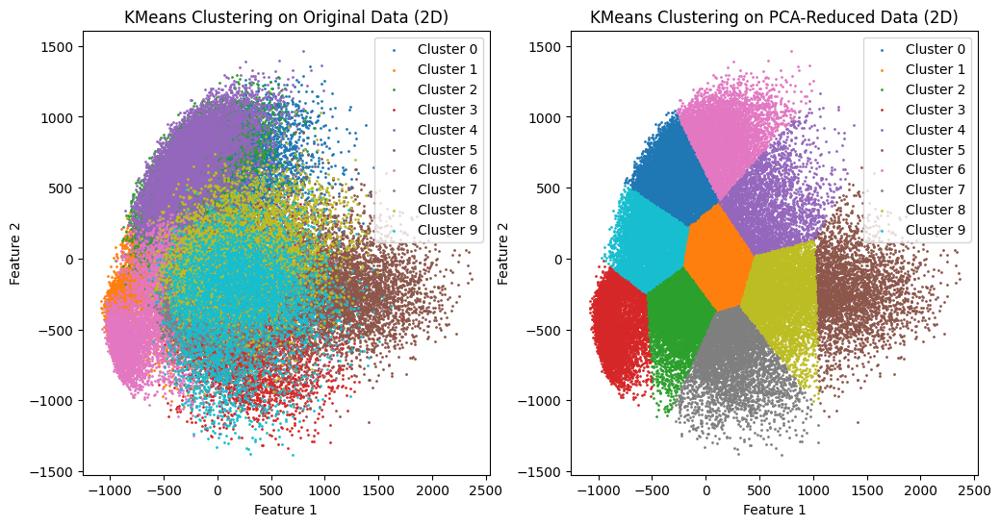

In [45]:
import os
import numpy as np
import gzip
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score, adjusted_rand_score

# Sử dụng KMeans để gom thành 10 cụm trên dữ liệu gốc
n_clusters = 10
kmeans_orig = KMeans(n_clusters=n_clusters, random_state=42)
kmeans_orig.fit(train_images)

# Giảm chiều dữ liệu xuống còn 2 chiều với PCA
pca_50 = PCA(n_components=2)
train_images_pca = pca_50.fit_transform(train_images)

# Sử dụng KMeans để gom thành 10 cụm trên dữ liệu đã giảm chiều
kmeans_pca = KMeans(n_clusters=n_clusters, random_state=42)
kmeans_pca.fit(train_images_pca)

# Tính toán thước đo cho dữ liệu gốc
ari_orig = adjusted_rand_score(train_labels, kmeans_orig.labels_)
print("Adjusted Rand Index (original):", ari_orig)

# Tính toán thước đo cho dữ liệu đã giảm chiều
ari_pca = adjusted_rand_score(train_labels, kmeans_pca.labels_)
print("Adjusted Rand Index (PCA):", ari_pca)

# Giảm chiều dữ liệu gốc xuống còn 2 chiều để trực quan hóa
pca_2_orig = PCA(n_components=2)
transformed_orig = pca_2_orig.fit_transform(train_images)

# Giảm chiều dữ liệu đã giảm chiều xuống còn 2 chiều để trực quan hóa
pca_2_pca = PCA(n_components=2)
transformed_pca = pca_2_pca.fit_transform(train_images_pca)

# Hiển thị trực quan và đánh dấu các cụm trên dữ liệu gốc
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
for i in range(n_clusters):
    cluster_points = transformed_orig[kmeans_orig.labels_ == i]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {i}', s=1)
plt.title('KMeans Clustering on Original Data (2D)')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()

# Hiển thị trực quan và đánh dấu các cụm trên dữ liệu đã giảm chiều
plt.subplot(1, 2, 2)
for i in range(n_clusters):
    cluster_points = transformed_pca[kmeans_pca.labels_ == i]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {i}', s=1)
plt.title('KMeans Clustering on PCA-Reduced Data (2D)')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()

plt.show()

#### 3.3.2 Visual 3D

In [46]:
import os
import numpy as np
import gzip
import matplotlib.pyplot as plt
import plotly.graph_objs as go
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score, adjusted_rand_score

# Sử dụng KMeans để gom thành 10 cụm trên dữ liệu gốc
n_clusters = 10
kmeans_orig = KMeans(n_clusters=n_clusters, random_state=42)
kmeans_orig.fit(train_images)

# Giảm chiều dữ liệu xuống còn 150 chiều với PCA
pca_50 = PCA(n_components=150)
train_images_pca = pca_50.fit_transform(train_images)

# Sử dụng KMeans để gom thành 10 cụm trên dữ liệu đã giảm chiều
kmeans_pca = KMeans(n_clusters=n_clusters, random_state=42)
kmeans_pca.fit(train_images_pca)

# Tính toán thước đo cho dữ liệu gốc
ari_orig = adjusted_rand_score(train_labels, kmeans_orig.labels_)
print("Adjusted Rand Index (original):", ari_orig)

# Tính toán thước đo cho dữ liệu đã giảm chiều
ari_pca = adjusted_rand_score(train_labels, kmeans_pca.labels_)
print("Adjusted Rand Index (PCA):", ari_pca)

# Giảm chiều dữ liệu gốc xuống còn 3 chiều để trực quan hóa
pca_3_orig = PCA(n_components=3)
transformed_orig = pca_3_orig.fit_transform(train_images)

# Giảm chiều dữ liệu đã giảm chiều xuống còn 3 chiều để trực quan hóa
pca_3_pca = PCA(n_components=3)
transformed_pca = pca_3_pca.fit_transform(train_images_pca)

# Hiển thị trực quan và đánh dấu các cụm trên dữ liệu gốc trong không gian 3 chiều
fig_orig = go.Figure()
for i in range(n_clusters):
    cluster_points = transformed_orig[kmeans_orig.labels_ == i]
    fig_orig.add_trace(go.Scatter3d(
        x=cluster_points[:, 0],
        y=cluster_points[:, 1],
        z=cluster_points[:, 2],
        mode='markers',
        marker=dict(size=2),
        name=f'Cluster {i}'
    ))

fig_orig.update_layout(
    title='KMeans Clustering on Original Data (3D)',
    scene=dict(
        xaxis_title='Feature 1',
        yaxis_title='Feature 2',
        zaxis_title='Feature 3'
    ),
    margin=dict(l=0, r=0, b=0, t=0)
)
fig_orig.show()

# Hiển thị trực quan và đánh dấu các cụm trên dữ liệu đã giảm chiều trong không gian 3 chiều
fig_pca = go.Figure()
for i in range(n_clusters):
    cluster_points = transformed_pca[kmeans_pca.labels_ == i]
    fig_pca.add_trace(go.Scatter3d(
        x=cluster_points[:, 0],
        y=cluster_points[:, 1],
        z=cluster_points[:, 2],
        mode='markers',
        marker=dict(size=2),
        name=f'Cluster {i}'
    ))

fig_pca.update_layout(
    title='KMeans Clustering on PCA-Reduced Data (3D)',
    scene=dict(
        xaxis_title='Feature 1',
        yaxis_title='Feature 2',
        zaxis_title='Feature 3'
    ),
    margin=dict(l=0, r=0, b=0, t=0)
)
fig_pca.show()


Adjusted Rand Index (original): 0.35988270313670967
Adjusted Rand Index (PCA): 0.4054454392671687
